In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"]="1"

import tensorflow as tf
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
  try:
    tf.config.experimental.set_virtual_device_configuration(
        gpus[0],[tf.config.experimental.VirtualDeviceConfiguration(memory_limit=5120)])
  except RuntimeError as e:
    print(e)

In [2]:
import glob
# import imageio
import matplotlib.pyplot as plt
import numpy as np
# import PIL
import tensorflow as tf
import tensorflow_probability as tfp
import time

In [3]:
%matplotlib inline

(train_images, train_labels), (test_images, test_labels) = tf.keras.datasets.fashion_mnist.load_data()

In [4]:
def batch_creation(X_data, batch_size):
    end = X_data.shape[0]-1
    start = 0
    batch_split_X = list()
    while start < end:
        img_slice = np.array(X_data[start:start+batch_size])
        batch_split_X.append(img_slice)
        start = start + batch_size
    return np.array(batch_split_X, dtype=object)

In [5]:
def preprocess_images(images):
    images = images.reshape((images.shape[0], 28, 28, 1)) / 255.
    return np.where(images > .5, 1.0, 0.0).astype('float32')

train_images = preprocess_images(train_images)
test_images = preprocess_images(test_images)

train_size = train_images.shape[0]
batch_size = 32
test_size = test_images.shape[0]

# train_dataset = batch_creation(train_images, 32)
# test_dataset = batch_creation(test_images, 32)
# train_dataset = train_dataset.astype(np.float32)
# test_dataset = test_dataset.astype(np.float32)
train_dataset = (tf.data.Dataset.from_tensor_slices(train_images)
                 .shuffle(train_size).batch(batch_size))
test_dataset = (tf.data.Dataset.from_tensor_slices(test_images)
                .shuffle(test_size).batch(batch_size))

In [6]:
class CVAE(tf.keras.Model):


    def __init__(self, latent_dim):
        super(CVAE, self).__init__()
        self.latent_dim = latent_dim
        self.encoder = tf.keras.Sequential(
              [
                  tf.keras.layers.InputLayer(input_shape=(28, 28, 1)),
                  tf.keras.layers.Conv2D(
                      filters=32, kernel_size=3, strides=(2, 2), activation='relu'),
                  tf.keras.layers.Conv2D(
                      filters=64, kernel_size=3, strides=(2, 2), activation='relu'),
                  tf.keras.layers.Flatten(),
                  # No activation
                  tf.keras.layers.Dense(latent_dim + latent_dim),
              ]
        )
        self.decoder = tf.keras.Sequential(
        [
            tf.keras.layers.InputLayer(input_shape=(latent_dim,)),
            tf.keras.layers.Dense(units=7*7*32, activation=tf.nn.relu),
            tf.keras.layers.Reshape(target_shape=(7, 7, 32)),
            tf.keras.layers.Conv2DTranspose(
                filters=64, kernel_size=3, strides=2, padding='same',
                    activation='relu'),
            tf.keras.layers.Conv2DTranspose(
                filters=32, kernel_size=3, strides=2, padding='same',
                    activation='relu'),
            # No activation
            tf.keras.layers.Conv2DTranspose(
                filters=1, kernel_size=3, strides=1, padding='same'),
            ]
        )
        
    @tf.function
    def sample(self, z=None):
        if z is None:
            z = tf.random.normal(shape=(100, self.latent_dim))
        return self.decode(z, apply_sigmoid=True)
    
    def encode(self, x):
        mean, logvar = tf.split(self.encoder(x), num_or_size_splits=2, axis=1)
        return mean, logvar

    def reparameterize(self, mean, logvar):
        eps = tf.random.normal(shape=mean.shape)
        return eps * tf.exp(logvar * .5) + mean
    
    def decode(self, z, apply_sigmoid=False):
        logits = self.decoder(z)
        if apply_sigmoid:
            probs = tf.sigmoid(logits)
            return probs
        return logits

In [7]:
latent_dim = 2

epochs = 20

In [8]:

def log_normal_pdf(sample, mean, logvar, raxis=1):
    log2pi = tf.math.log(2. * np.pi)
    return tf.reduce_sum(
        -.5 * ((sample - mean) ** 2. * tf.exp(-logvar) + logvar + log2pi),
        axis=raxis)

In [9]:
def compute_loss(model, x):
    mean, logvar = model.encode(x)
    z = model.reparameterize(mean, logvar)
    x_logit = model.decode(z)
    cross_ent = tf.nn.sigmoid_cross_entropy_with_logits(logits=x_logit, labels=x)
    logpx_z = -tf.reduce_sum(cross_ent, axis=[1, 2, 3])
    logpz = log_normal_pdf(z, 0., 0.)
    logqz_x = log_normal_pdf(z, mean, logvar)
    return -tf.reduce_mean(logpx_z + logpz - logqz_x)

In [10]:

@tf.function
def train_step(model, x, optimizer):

    with tf.GradientTape() as tape:
        loss = compute_loss(model, x)
    gradients = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(gradients, model.trainable_variables))

In [11]:
model = CVAE(latent_dim)
model.encoder.summary()
model.decoder.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 13, 13, 32)        320       
                                                                 
 conv2d_1 (Conv2D)           (None, 6, 6, 64)          18496     
                                                                 
 flatten (Flatten)           (None, 2304)              0         
                                                                 
 dense (Dense)               (None, 4)                 9220      
                                                                 
Total params: 28,036
Trainable params: 28,036
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1 (Dense)             (

In [12]:
def plot_latent_images(model, n, epoch, im_size=28, save=True, first_epoch=False, f_ep_count=0):
    

    # Create image matrix 
    image_width = im_size*n
    image_height = image_width
    image = np.zeros((image_height, image_width))

    

    # Create list of values which are evenly spaced wrt probability mass

    norm = tfp.distributions.Normal(0, 1)
    grid_x = norm.quantile(np.linspace(0.05, 0.95, n))
    grid_y = norm.quantile(np.linspace(0.05, 0.95, n))


    # For each point on the grid in the latent space, decode and

    # copy the image into the image array
    for i, yi in enumerate(grid_x):
        for j, xi in enumerate(grid_y):
            z = np.array([[xi, yi]])
            x_decoded = model.sample(z)
            digit = tf.reshape(x_decoded[0], (im_size, im_size))
            image[i * im_size: (i + 1) * im_size,
                  j * im_size: (j + 1) * im_size] = digit.numpy()
    

    # Plot the image array
    plt.figure(figsize=(10, 10))
    plt.imshow(image, cmap='Greys_r')
    plt.axis('Off')


    # Potentially save, with different formatting if within first epoch
    if save and first_epoch:
        plt.savefig('tf_grid_at_epoch_{:04d}.{:04d}.png'.format(epoch, f_ep_count))
    elif save:
        plt.savefig('tf_grid_at_epoch_{:04d}.png'.format(epoch))
    plt.show()

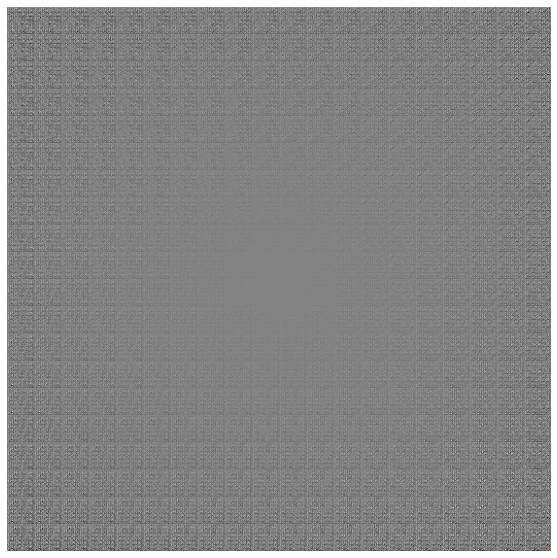

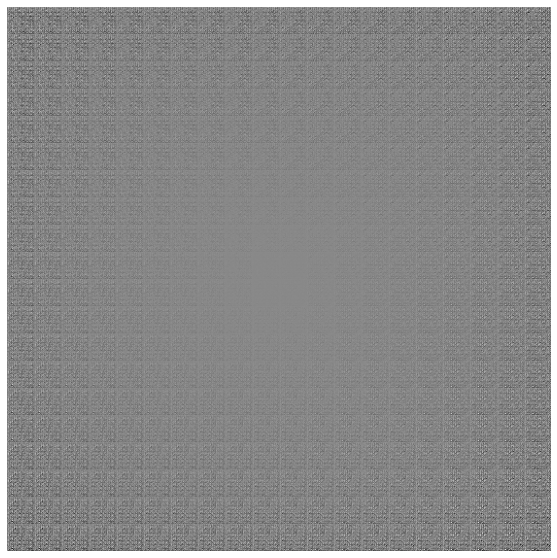

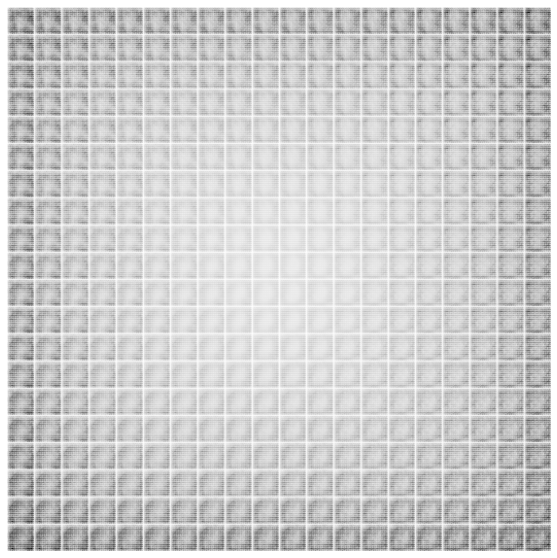

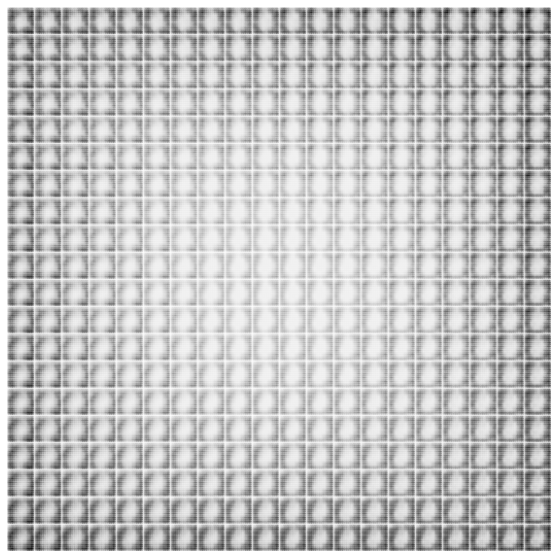

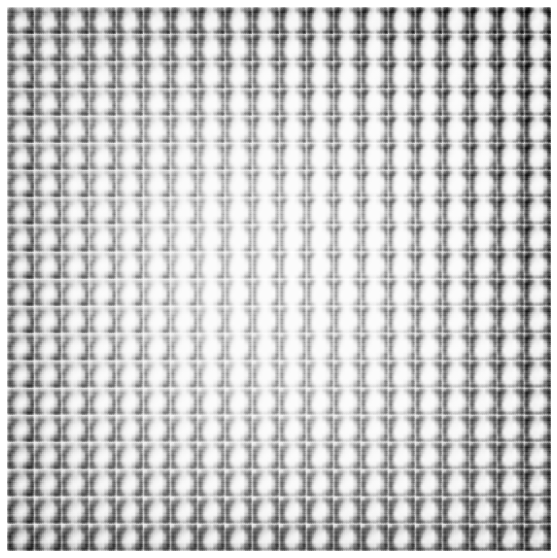

...

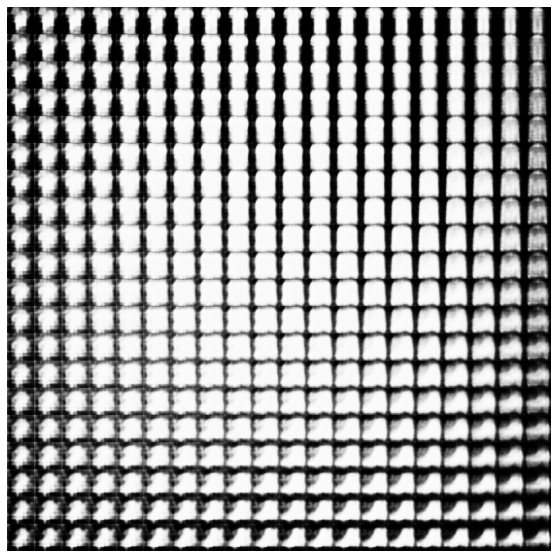

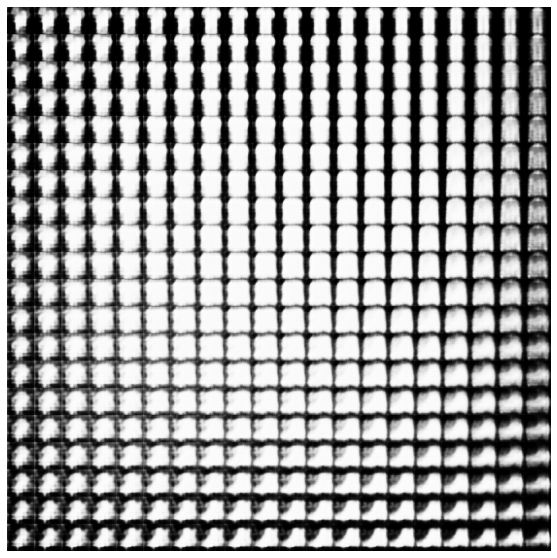

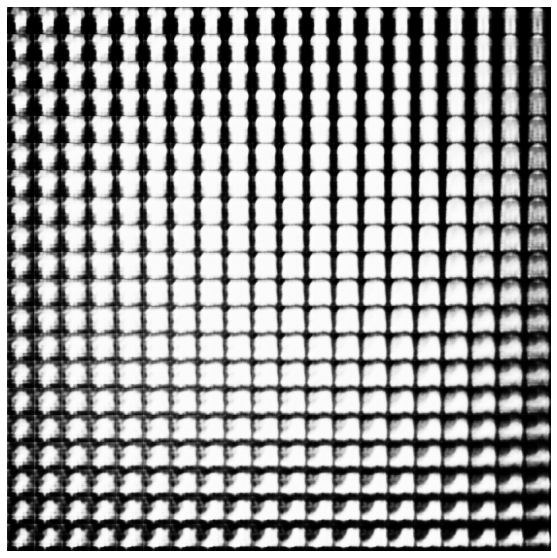

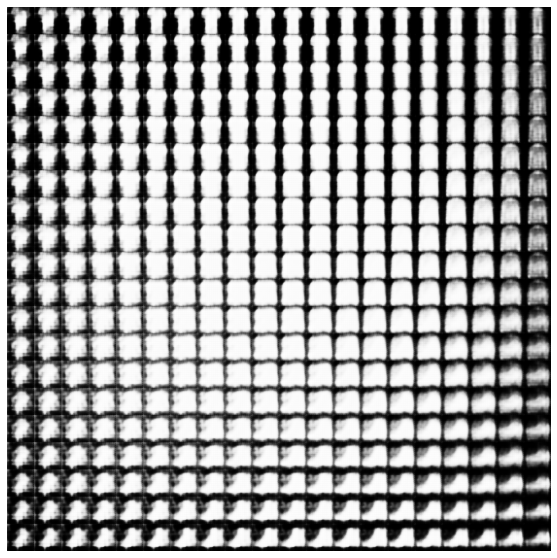

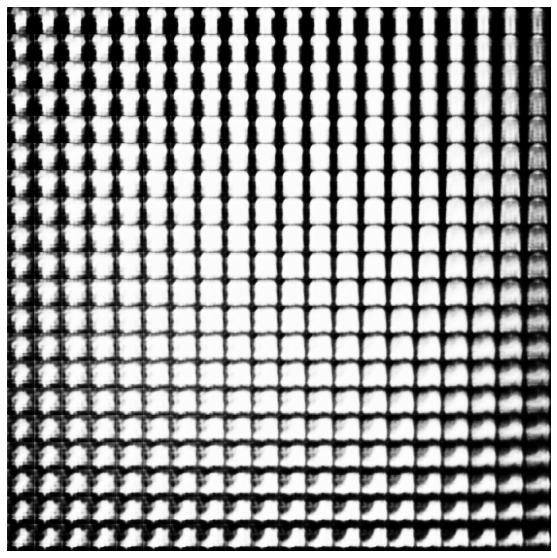

Epoch: 1, Test set ELBO: -225.58314514160156, time elapse for current epoch: 98.74619626998901
Epoch: 2, Test set ELBO: -214.79208374023438, time elapse for current epoch: 36.61213541030884


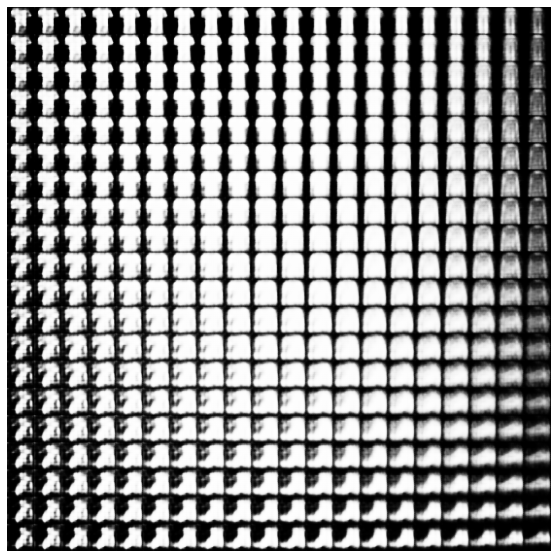

Epoch: 3, Test set ELBO: -207.74716186523438, time elapse for current epoch: 41.0690438747406


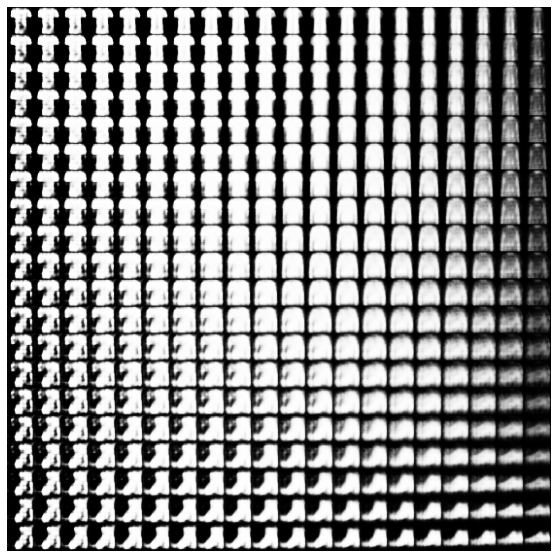

Epoch: 4, Test set ELBO: -203.11036682128906, time elapse for current epoch: 37.828046798706055


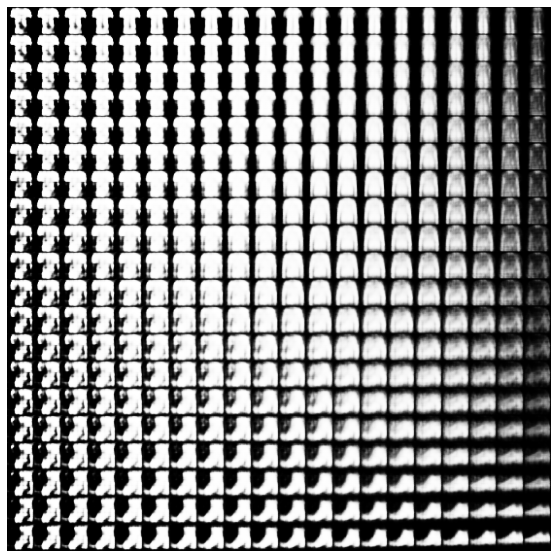

Epoch: 5, Test set ELBO: -200.1267547607422, time elapse for current epoch: 37.01839756965637


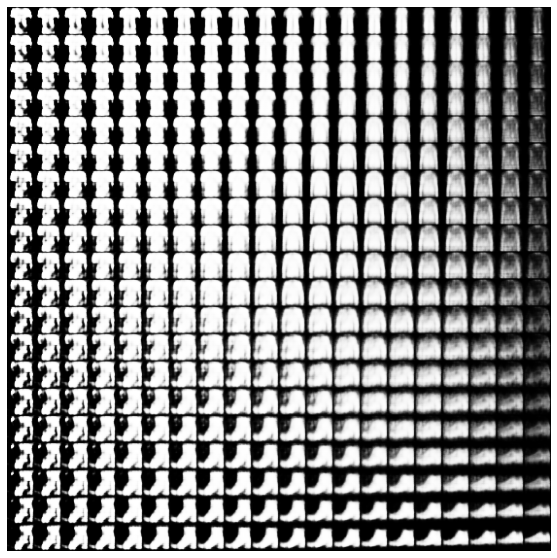

Epoch: 6, Test set ELBO: -198.22764587402344, time elapse for current epoch: 36.602537393569946


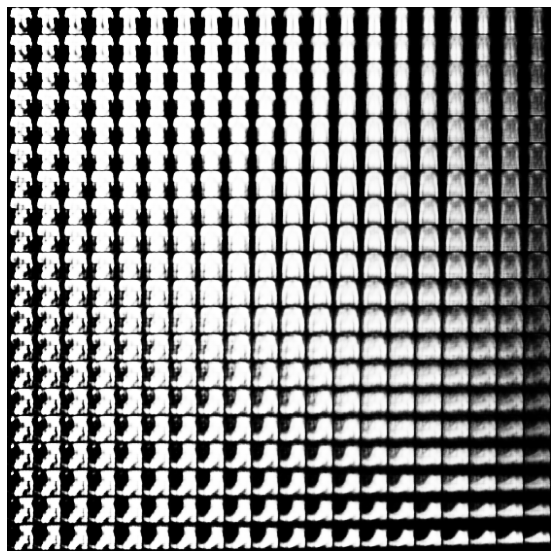

Epoch: 7, Test set ELBO: -196.7775115966797, time elapse for current epoch: 36.72347974777222


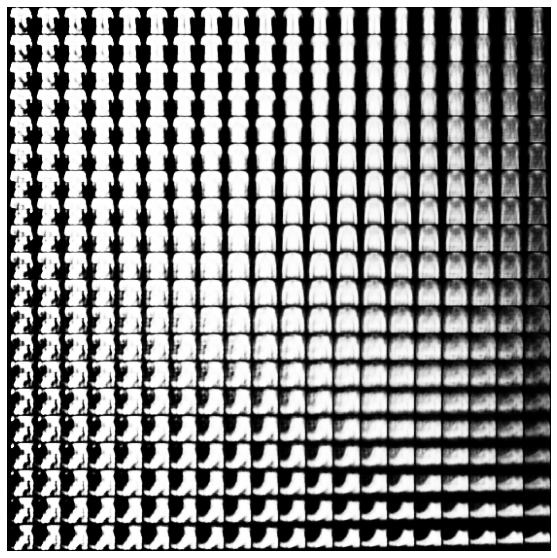

Epoch: 8, Test set ELBO: -195.82957458496094, time elapse for current epoch: 36.06397294998169


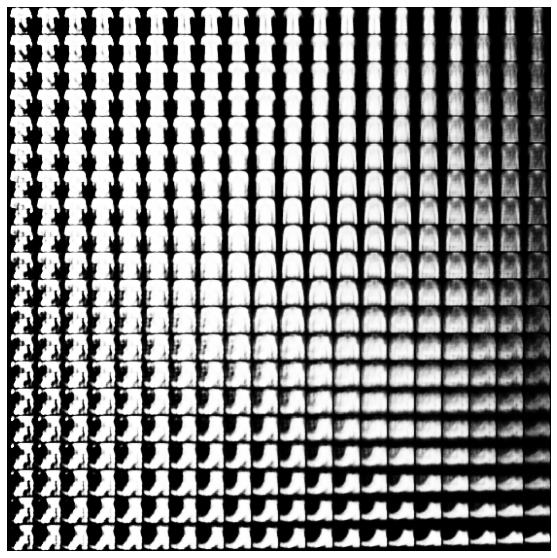

Epoch: 9, Test set ELBO: -194.4119873046875, time elapse for current epoch: 36.63019633293152


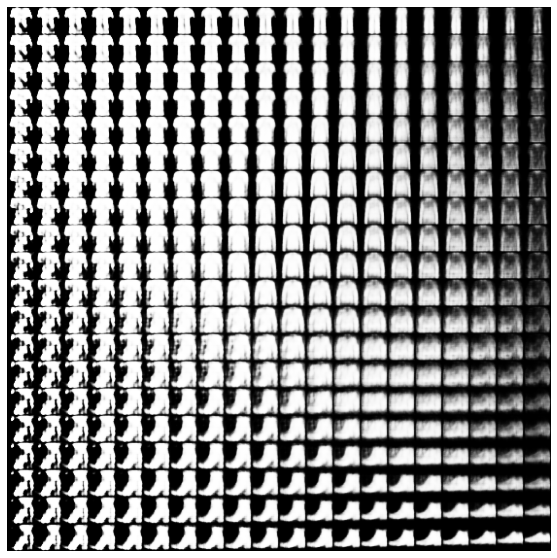

Epoch: 10, Test set ELBO: -194.43556213378906, time elapse for current epoch: 36.56179070472717


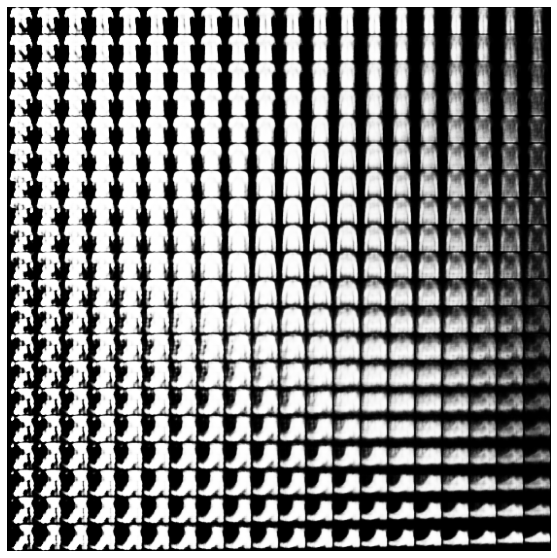

Epoch: 11, Test set ELBO: -193.3103485107422, time elapse for current epoch: 36.8353111743927


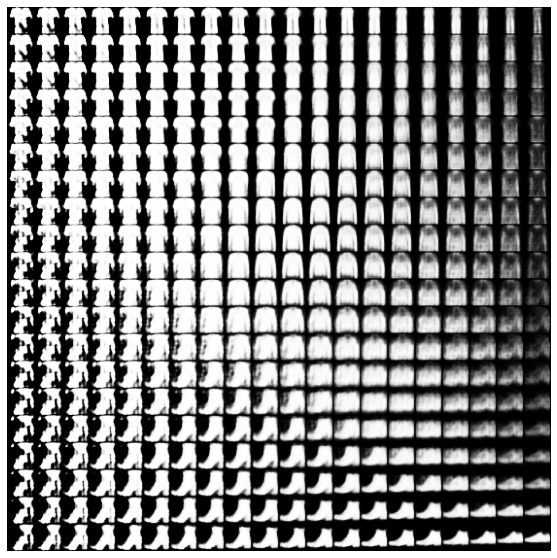

Epoch: 12, Test set ELBO: -191.966796875, time elapse for current epoch: 37.2730975151062


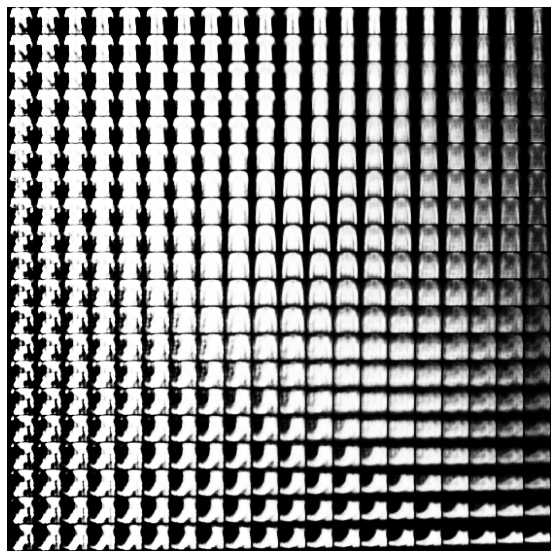

Epoch: 13, Test set ELBO: -191.70301818847656, time elapse for current epoch: 36.86932921409607


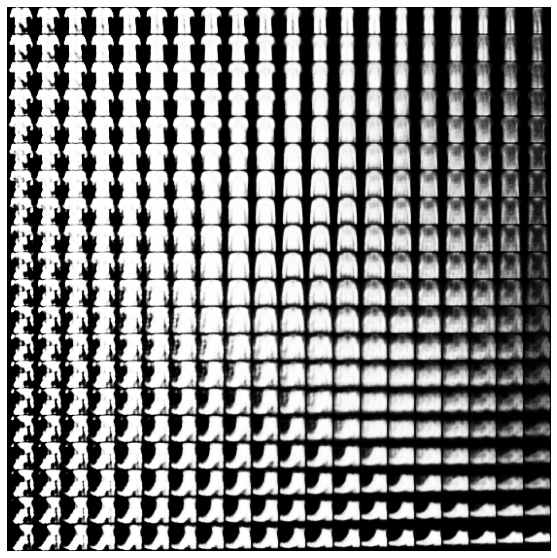

Epoch: 14, Test set ELBO: -190.99488830566406, time elapse for current epoch: 38.03494143486023


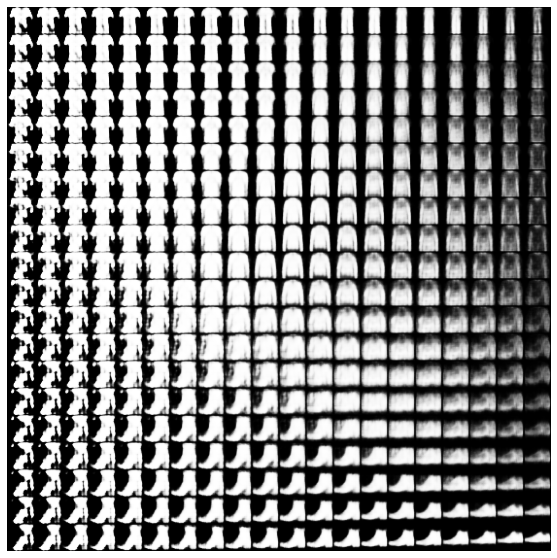

Epoch: 15, Test set ELBO: -191.60728454589844, time elapse for current epoch: 38.84306859970093


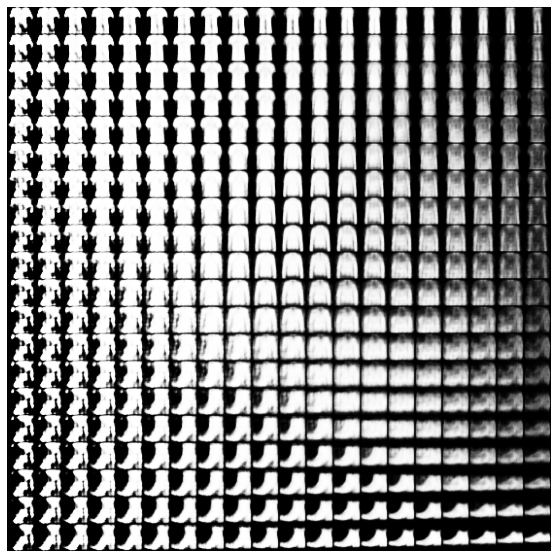

Epoch: 16, Test set ELBO: -191.06661987304688, time elapse for current epoch: 41.07492399215698


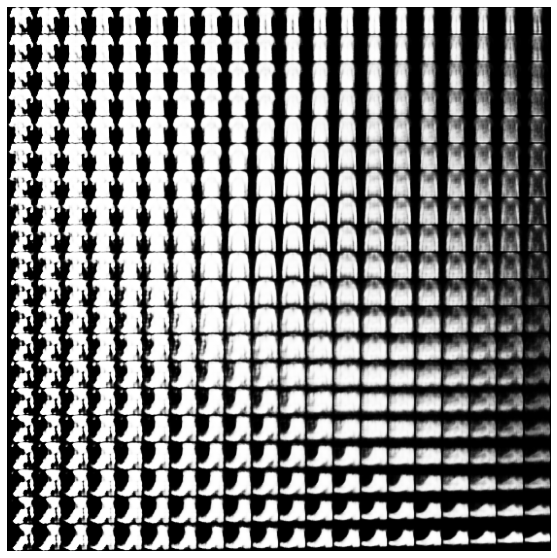

Epoch: 17, Test set ELBO: -190.35662841796875, time elapse for current epoch: 37.58731651306152


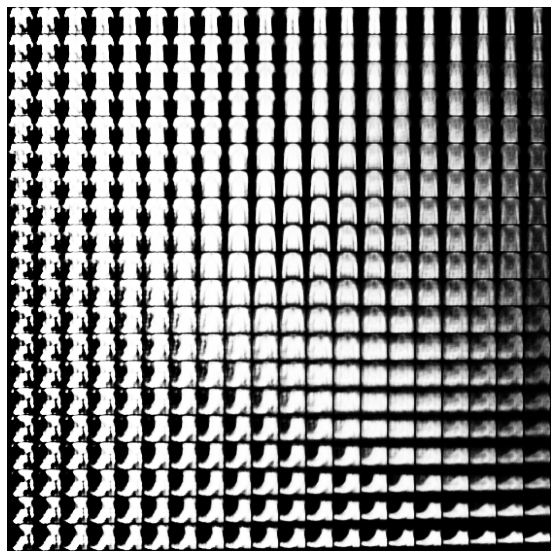

Epoch: 18, Test set ELBO: -189.7091522216797, time elapse for current epoch: 36.439788579940796


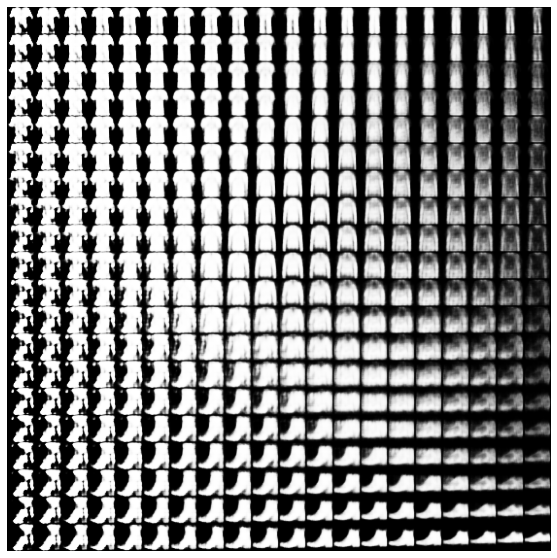

Epoch: 19, Test set ELBO: -190.0198974609375, time elapse for current epoch: 41.05676221847534


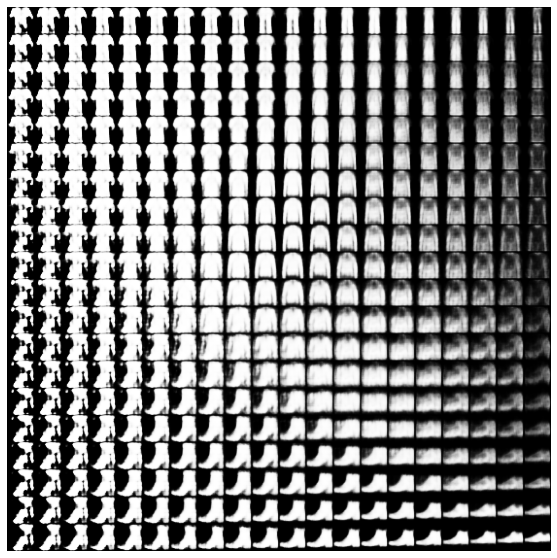

Epoch: 20, Test set ELBO: -189.64292907714844, time elapse for current epoch: 41.09225344657898


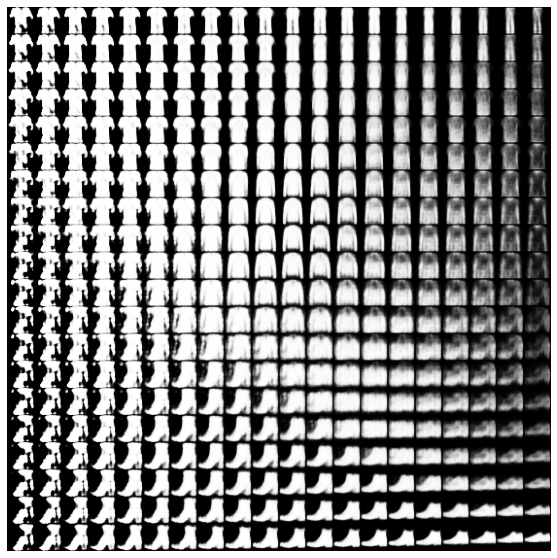

In [13]:
tf.config.run_functions_eagerly(True)
plot_latent_images(model, 20, epoch=0)


optimizer = tf.keras.optimizers.Adam(1e-4)

for epoch in range(1, epochs + 1):
    start_time = time.time()
    for idx, train_x in enumerate(train_dataset):
        train_step(model, train_x, optimizer)
        if epoch == 1 and idx % 75 == 0:
            plot_latent_images(model, 20, epoch=epoch, first_epoch=True, f_ep_count=idx)          
    end_time = time.time()
    loss = tf.keras.metrics.Mean()
    for test_x in test_dataset:
        loss(compute_loss(model, test_x))
    elbo = -loss.result()
    #display.clear_output(wait=False)
    print('Epoch: {}, Test set ELBO: {}, time elapse for current epoch: {}'
        .format(epoch, elbo, end_time - start_time))
    if epoch != 1:
        plot_latent_images(model, 20, epoch=epoch)

In [14]:
mean, var = model.encode(test_images)

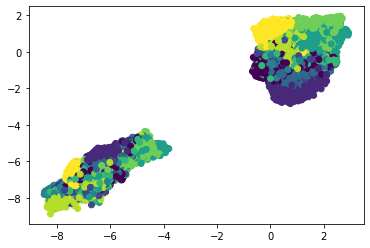

In [15]:
fig = plt.figure()
plt.scatter(var[:,0], var[:,1], c=test_labels)
plt.scatter(mean[:,0], mean[:,1], c=test_labels)